Notebook by Jan Schlüter, Johannes Kepler University Linz, Austria

# Descript Audio Codec: Manipulating codes and latents

##1. Setup

In [1]:
%pwd

'/home/mille/dac_test'

In [2]:
#@title Imports

from pathlib import Path

import torch
import torchaudio
from IPython.display import Audio
import dac
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [3]:
#@title Download and load DAC model

model_path = dac.utils.download()
model = dac.DAC.load(model_path)
model = model.to('cpu')

/home/mille/.local/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


In [4]:
output_dir = "output"

##2. Execution

### Prepare the input audio file

Either upload a file using the file browser on the left and enter the file name, or paste a YouTube URL. (If the YouTube download fails, it may help to disconnect from the runtime and connect to a new one.)

In [5]:
# file_1 = "beatbox_aligned.wav"
file_1 = "violin.wav"
file_2 = "makam.wav"

We will only use an excerpt. Define the start and end here.

In [6]:
# Load the audio file

def load_mono(file_name, target_sr):
    audio, sr = torchaudio.load(file_name)
    if audio.shape[0] > 1:
        audio = audio.mean(0, keepdim=True)

    if sr != target_sr:
        audio = torchaudio.functional.resample(audio, sr, target_sr)
        sr = target_sr
    audio = audio.clamp(-1, 1)
    return audio

target_sr = model.sample_rate  # Target sample rate to match the model's requirements
audio_1 = load_mono(file_1, target_sr)
audio_2 = load_mono(file_2, target_sr)


# Show the excerpt
display(Audio(audio_1, rate=target_sr))
display(Audio(audio_2, rate=target_sr))

In [ ]:
#@title Encode with DAC
with torch.inference_mode():
    z1 = model.encoder(model.preprocess(audio_1, target_sr).to(model.device).unsqueeze(0))
    z2 = model.encoder(model.preprocess(audio_2, target_sr).to(model.device).unsqueeze(0))

# truncate tail of z1
l = min(z1.shape[2], z2.shape[2])
z1 = z1[:,:,:l]
z2 = z2[:,:,:l]

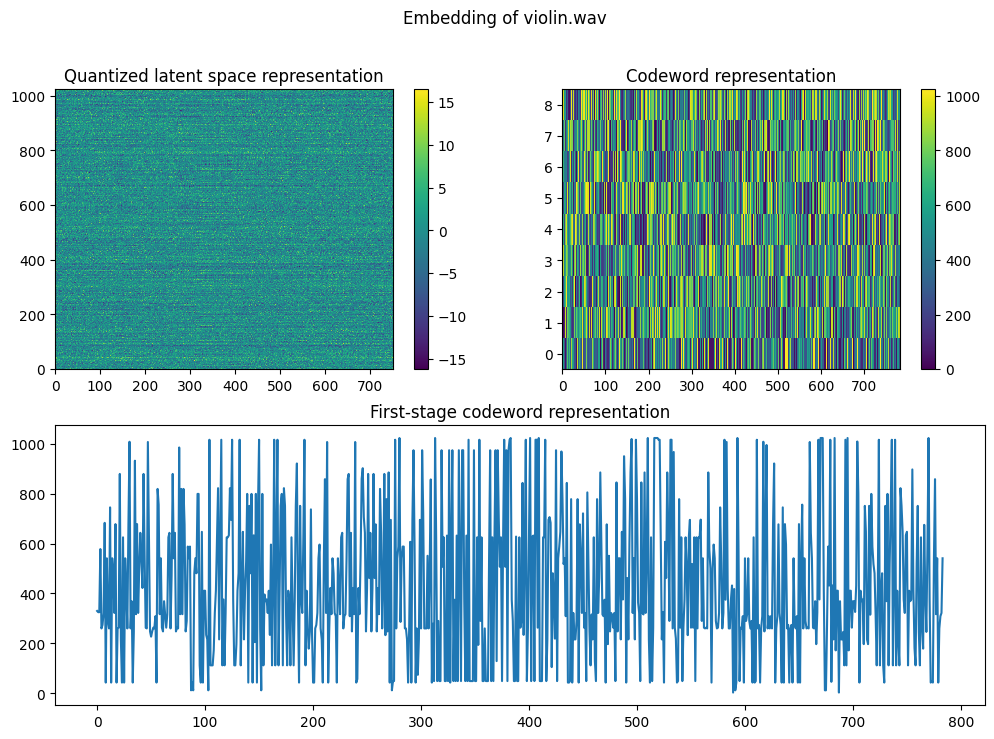

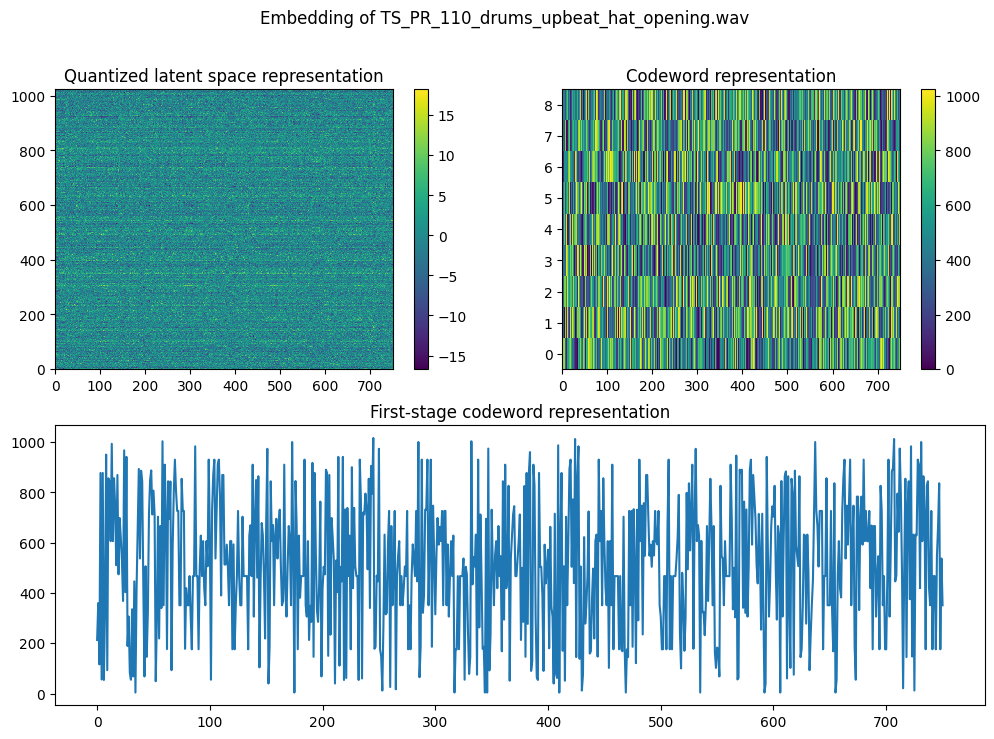

In [ ]:
#@title Visualize encoded latents and codes

def plot_embedding(z, codes, suptitle=None):
    fig = plt.figure(figsize=(12,8))
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1])

    ax1 = plt.subplot(gs[0, 0])
    ax2 = plt.subplot(gs[0, 1])
    ax3 = plt.subplot(gs[1, :])

    im = ax1.imshow(z[0].detach().cpu().numpy(), aspect='auto', origin='lower', interpolation='nearest')
    plt.colorbar(im)
    ax1.set_title("Quantized latent space representation")

    im = ax2.imshow(codes[0].detach().cpu().numpy(), aspect='auto', origin='lower', interpolation='nearest')
    plt.colorbar(im)
    ax2.set_title("Codeword representation")

    ax3.plot(codes[0,0])
    ax3.set_title("First-stage codeword representation")

    fig.suptitle(suptitle)
        
plot_embedding(z1, codes1, f"Embedding of {file_1}")
plot_embedding(z2, codes2, f"Embedding of {file_2}")

In [8]:
def generate_merges(z1, z2, opacities=[0.5], requantize=True):
    merged_audio = []
    for opacity in opacities:
        with torch.inference_mode():
            # from original latents:
            z_merged = (1-opacity)*z1 + opacity*z2

            if requantize:
                z_merged, _, _, _, _ = model.quantizer(z_merged, None)
            
            output = model.decode(z_merged)
            # from scaled latents
            #output = model.decode(5 + z * 0.5)

            # from original codes:
            #output = model.decode(model.quantizer.from_codes(codes)[0])
            # from time-reversed codes:
            #output = model.decode(model.quantizer.from_codes(codes.flip(-1))[0])
            # from every second code:
            #output = model.decode(model.quantizer.from_codes(codes[:, :, ::2])[0])
        
        merged_audio.append(output)
    
    return merged_audio

def dynamic_merge(z1, z2, start_opacity=0, end_opacity=1, requantize=True):
    with torch.inference_mode():
        envelope = torch.ones_like(z1)
        envelope = envelope * torch.linspace(start_opacity, end_opacity, envelope.size(dim=2))
        
        z_merged = z1 * (1-envelope) + z2 * envelope

        if requantize:
            z_merged, _, _, _, _ = model.quantizer(z_merged, None)

        output = model.decode(z_merged)

    return output

def l2_distance(z1, z2):
    # calculates sample-wise l2 distance in embedding space between two latent space representations
    # returns signal length average, list of distances as well as residual representation
    residual = z1 - z2

    distances = torch.norm(residual[0], dim=0)

    average_distance = float(torch.mean(distances))

    return average_distance, distances, residual
    

In [9]:
#@title Decode from latents or codes
opacities = [0, 0.25, 0.5, 0.75, 1, -1, 1.5, 2]

merged_audio = generate_merges(z1, z2, opacities, True)

for i, output in enumerate(merged_audio):
    # show output
    print(f"opacity: {opacities[i]}")
    display(Audio(output[0].detach().cpu().numpy(), rate=target_sr))

opacity: 0


opacity: 0.25


opacity: 0.5


opacity: 0.75


opacity: 1


opacity: -1


opacity: 1.5


opacity: 2


In [ ]:
# save result (to download via the file browser on the left)
for i, output in enumerate(merged_audio):
    torchaudio.save(f"quantized_merges/output_{str(int(opacities[i]*100))}.flac", output[0], target_sr)

In [10]:
start_opacity = -1
end_opacity = 2

enveloped_merge = dynamic_merge(z1, z2, start_opacity, end_opacity, False)
display(Audio(enveloped_merge[0].detach().cpu().numpy(), rate=target_sr))

In [21]:
torchaudio.save(f"merges/output_envelope_{str(int(start_opacity*100))}_{str(int(end_opacity*100))}.flac", enveloped_merge[0], target_sr)

torch.Size([751])
Average embedding distance:  153.16940307617188


(0.0, 46.2)

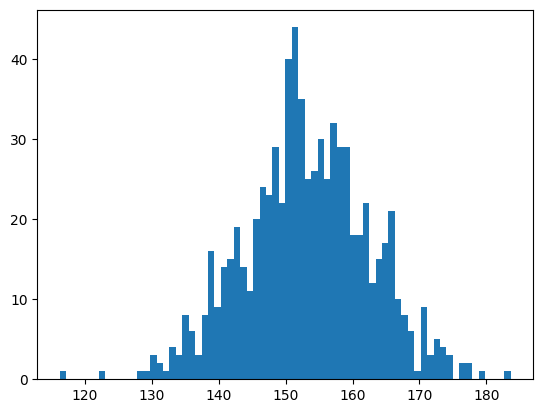

In [40]:
average_distance, distances, residual = l2_distance(z1, z2)
print(distances.shape)

print("Average embedding distance: ", average_distance)

# distribution of embedding space distances
plt.figure()
plt.hist(distances, bins=70)
plt.gca().set_ylim(bottom=0)

In [41]:
with torch.inference_mode():
    q_residual_12, _, _, _, _ = model.quantizer(residual, None)
    residual_audio_12 = model.decode(q_residual_12)

    q_residual_21, _, _, _, _ = model.quantizer(-residual, None)
    residual_audio_21 = model.decode(q_residual_21)


display(Audio(residual_audio_12[0].detach().cpu().numpy(), rate=target_sr))
display(Audio(residual_audio_21[0].detach().cpu().numpy(), rate=target_sr))

In [33]:
torchaudio.save(f"{output_dir}/residuals/beatbox_pop_rock.flac", residual_audio_12[0], target_sr)
torchaudio.save(f"{output_dir}/residuals/pop_rock_beatbox.flac", residual_audio_21[0], target_sr)